In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing

In [4]:
import os

from sklearn.preprocessing import MinMaxScaler
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, r2_score

In [5]:
import chardet
with open('train_data.csv', 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

{'encoding': 'GB2312', 'confidence': 0.99, 'language': 'Chinese'}

In [8]:
df = pd.read_csv('train_data.csv',encoding='GB2312')
df['Count']=1
df.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558,41-50,1


In [7]:
df.Age.unique()

array(['51-60', '71-80', '31-40', '41-50', '81-90', '61-70', '21-30',
       '20-11月', '0-10', '91-100'], dtype=object)

In [9]:
# Step 1: Exploration of Data (EDA)

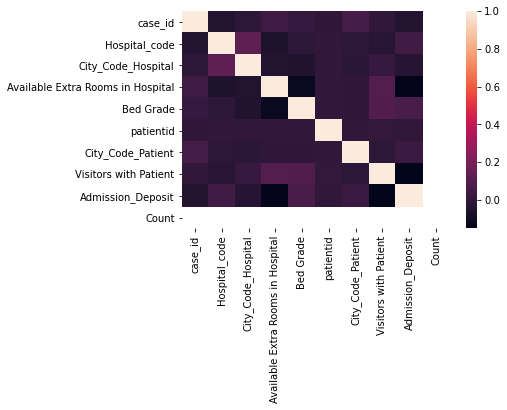

In [10]:
# Find the relationship between each numerical columns
# The highest correlation ratio is about 0.3 between ‘Hospital_code’ and ‘City_code_hospital’
sns.heatmap(df.corr())

In [11]:
# Find the patient distribution of different hospital regions.
# X hospital region has most patients, double the number of Z region

df_hos_reg = df.groupby('Hospital_region_code')['Count'].sum().reset_index().sort_values(by='Count', ascending=False)
fig_2 = px.bar(df_hos_reg,x='Hospital_region_code',y='Count',labels={'Count':'Number of patiens'})
fig_2.update_layout(title='Patient distribution per hospital region', title_x=0.5)
fig_2.show()

In [12]:
# Find the number of extra rooms in different hospital regions
# The number has the same propotion as the patient distribution, more patients with more extra rooms

df_room_reg = df.groupby('Hospital_region_code')['Available Extra Rooms in Hospital'].sum().reset_index().sort_values(by='Available Extra Rooms in Hospital', ascending=False)
fig_3 = px.bar(df_room_reg, x='Hospital_region_code',y='Available Extra Rooms in Hospital')
fig_3.update_layout(title='Number of extra rooms per hospital region', title_x=0.5)
fig_3.show()

In [13]:
# Find the distribution of the number of extra rooms
# The center of the distribution locates at 2,3,4. Most hospitals have 2-4 available extra rooms.

fig_1 = px.histogram(df, x='Available Extra Rooms in Hospital', marginal='box')
fig_1.update_layout(title='Number of extra rooms in each hospital', title_x=0.5)
fig_1.show()

In [14]:
# Patients Distribution for each hospital departments
# Most patients came from gynecology department

df_dept = df.groupby('Department')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig_4 = px.bar(df_dept, x='Department',y='Count', labels={'Count':'Number of patients'})
fig_4.update_layout(title='Patients per department', title_x=0.5)
fig_4.show()                                                                           

In [15]:
# Check the severity of illness of all the patients
# More than half the patients with moderate illness, followed by minor illness

df_sev=df.groupby('Severity of Illness')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig_5=px.funnel(df_sev,x='Count',y='Severity of Illness',labels={'Count':'Number of patients'})
fig_5.update_layout(title='Number of patients based on severity of illness',title_x=0.5)
fig_5.show()

In [16]:
# Step-2: Data Cleaning

In [19]:
# Check the missing values for each column
df.isnull().sum()

case_id                                 0
Hospital_code                           0
Hospital_type_code                      0
City_Code_Hospital                      0
Hospital_region_code                    0
Available Extra Rooms in Hospital       0
Department                              0
Ward_Type                               0
Ward_Facility_Code                      0
Bed Grade                             113
patientid                               0
City_Code_Patient                    4532
Type of Admission                       0
Severity of Illness                     0
Visitors with Patient                   0
Age                                     0
Admission_Deposit                       0
Stay                                    0
Count                                   0
dtype: int64

In [20]:
# delete all the null values
df = df.dropna(subset=['City_Code_Patient'])
df = df.dropna(subset=['Bed Grade'])

In [21]:
df.isnull().sum()

case_id                              0
Hospital_code                        0
Hospital_type_code                   0
City_Code_Hospital                   0
Hospital_region_code                 0
Available Extra Rooms in Hospital    0
Department                           0
Ward_Type                            0
Ward_Facility_Code                   0
Bed Grade                            0
patientid                            0
City_Code_Patient                    0
Type of Admission                    0
Severity of Illness                  0
Visitors with Patient                0
Age                                  0
Admission_Deposit                    0
Stay                                 0
Count                                0
dtype: int64

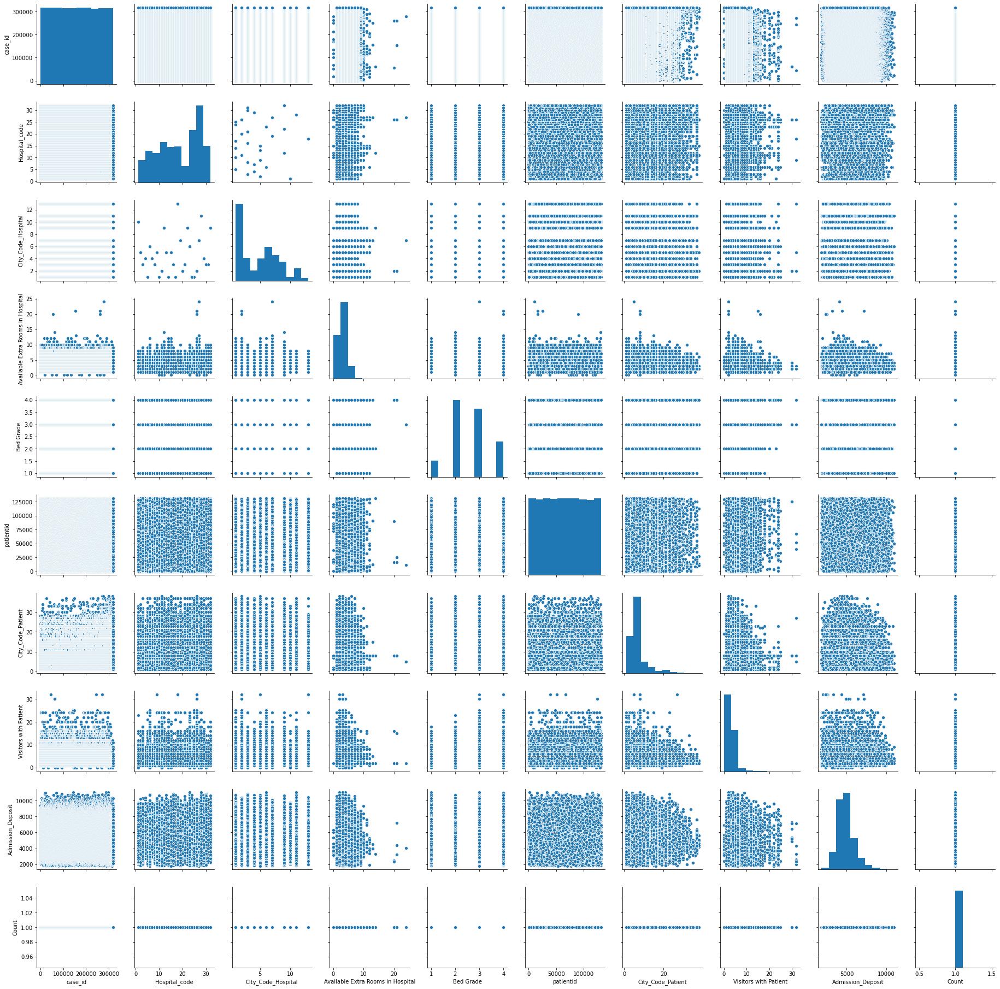

In [22]:
# plot to check the outliers, there are some extinguish values in 'Available Extra Rooms in Hospital'
g = sns.pairplot(df)

In [23]:
# Step-3: Trans categorical data to numerical data

In [24]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [25]:
pd.set_option('display.max_columns', None)

In [26]:
# one-hot encoding for non-ordinal columns
def onehot_encode(data, columns):
    for column in columns:
        dummies = pd.get_dummies(data[column])
        data = pd.concat([data,dummies], axis=1)
        data.drop(column,axis=1,inplace=True)
    return data

In [27]:
# select all the columns need to be ont-hot encoding
onehot_columns = (['Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type', 'Ward_Facility_Code'])
df = onehot_encode(df, onehot_columns)

In [28]:
# Map ordinal categorical data into numerical data
# by using label encoding
# keep target column 'stay' as categorical data

lbl_encode = preprocessing.LabelEncoder()
df['Type of Admission'] = df['Type of Admission'].map({'Trauma':0, 'Urgent':1, 'Emergency':2})
df['Severity of Illness'] = df['Severity of Illness'].map({'Minor':0, 'Moderate':1, 'Extreme':2})

df['Age']=df['Age'].map({'20-11月':0,'0-10':1,'21-30':2,'31-40':3,'41-50':4,'51-60':5,'61-70':6,'71-80':7,'81-90':8,'91-100':9})
#df['Stay_1']=df['Stay'].map({'20-11月':0,'0-10':1,'21-30':2,'31-40':3,'41-50':4,'51-60':5,'61-70':6,'71-80':7,'81-90':8,'91-100':9, 'More than 100 Days':10})

df.head()

,case_id,Hospital_code,City_Code_Hospital,Available Extra Rooms in Hospital,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count,a,b,c,d,e,f,g,X,Y,Z,TB & Chest disease,anesthesia,gynecology,radiotherapy,surgery,P,Q,R,S,T,U,A,B,C,D,E,F
0,1,8,3,3,2.0,31397,7.0,2,2,2,5,4911,0-10,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
1,2,2,5,2,2.0,31397,7.0,0,2,2,5,5954,41-50,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1
2,3,10,1,2,2.0,31397,7.0,0,2,2,5,4745,31-40,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
3,4,26,2,2,2.0,31397,7.0,0,2,2,5,7272,41-50,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0
4,5,26,2,2,2.0,31397,7.0,0,2,2,5,5558,41-50,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0


In [29]:
# Step-4: scale all the data into -1 to 1
from sklearn.preprocessing import StandardScaler

In [30]:
# set 'case_id' as index instead of a variable feature
df.set_index('case_id', inplace=True)

In [31]:
# sperate the dataset into features columns and one target column
features = df.drop(['Count','Stay'], axis=1)
target = df['Stay']
features.head()

,Hospital_code,City_Code_Hospital,Available Extra Rooms in Hospital,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,a,b,c,d,e,f,g,X,Y,Z,TB & Chest disease,anesthesia,gynecology,radiotherapy,surgery,P,Q,R,S,T,U,A,B,C,D,E,F
case_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,8,3,3,2.0,31397,7.0,2,2,2,5,4911,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1
2,2,5,2,2.0,31397,7.0,0,2,2,5,5954,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1
3,10,1,2,2.0,31397,7.0,0,2,2,5,4745,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
4,26,2,2,2.0,31397,7.0,0,2,2,5,7272,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0
5,26,2,2,2.0,31397,7.0,0,2,2,5,5558,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0


In [32]:
# standard scaler, cons is easy to be influenced by outliers
sc = StandardScaler()
features_sca = sc.fit_transform(features)
features_scaler = pd.DataFrame(features_sca, columns=features.columns, index=features.index)
features_scaler.head()

,Hospital_code,City_Code_Hospital,Available Extra Rooms in Hospital,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,a,b,c,d,e,f,g,X,Y,Z,TB & Chest disease,anesthesia,gynecology,radiotherapy,surgery,P,Q,R,S,T,U,A,B,C,D,E,F
case_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,-1.196074,-0.573006,-0.168178,-0.71389,-0.904366,-0.0532,1.215408,1.644851,-0.727035,0.463634,0.026796,-0.903743,-0.526598,2.432911,-0.262032,-0.289633,-0.186623,-0.116993,-0.84563,-0.792483,2.017041,-0.176308,-0.320238,-1.902229,3.185277,-0.060464,-0.126587,-0.706586,1.219986,-0.569121,-0.068488,-0.005356,-0.31028,-0.352761,-0.355138,-0.44145,-0.456837,1.351596
2,-1.891033,0.071484,-1.024400,-0.71389,-0.904366,-0.0532,-0.973443,1.644851,-0.727035,0.463634,0.986987,-0.903743,-0.526598,2.432911,-0.262032,-0.289633,-0.186623,-0.116993,-0.84563,-0.792483,2.017041,-0.176308,-0.320238,-1.902229,3.185277,-0.060464,-0.126587,-0.706586,-0.819681,1.757097,-0.068488,-0.005356,-0.31028,-0.352761,-0.355138,-0.44145,-0.456837,1.351596
3,-0.964420,-1.217495,-1.024400,-0.71389,-0.904366,-0.0532,-0.973443,1.644851,-0.727035,0.463634,-0.126025,-0.903743,-0.526598,-0.411030,-0.262032,3.452642,-0.186623,-0.116993,1.18255,-0.792483,-0.495776,-0.176308,3.122679,-1.902229,-0.313944,-0.060464,-0.126587,-0.706586,-0.819681,1.757097,-0.068488,-0.005356,-0.31028,-0.352761,-0.355138,-0.44145,2.188965,-0.739866
4,0.888804,-0.895250,-1.024400,-0.71389,-0.904366,-0.0532,-0.973443,1.644851,-0.727035,0.463634,2.200344,-0.903743,1.898983,-0.411030,-0.262032,-0.289633,-0.186623,-0.116993,-0.84563,1.261856,-0.495776,-0.176308,-0.320238,-1.902229,3.185277,-0.060464,-0.126587,-0.706586,1.219986,-0.569121,-0.068488,-0.005356,-0.31028,-0.352761,-0.355138,2.26526,-0.456837,-0.739866
5,0.888804,-0.895250,-1.024400,-0.71389,-0.904366,-0.0532,-0.973443,1.644851,-0.727035,0.463634,0.622427,-0.903743,1.898983,-0.411030,-0.262032,-0.289633,-0.186623,-0.116993,-0.84563,1.261856,-0.495776,-0.176308,-0.320238,-1.902229,3.185277,-0.060464,-0.126587,-0.706586,-0.819681,1.757097,-0.068488,-0.005356,-0.31028,-0.352761,-0.355138,2.26526,-0.456837,-0.739866


In [33]:
# Step-5: features engineering & split dataset 

In [34]:
# split the dataset into training and testing datasets
# using 80% for training, using the resting 20% for testing
# y is still catagorical data, not convert into continous
x_train, x_test, y_train, y_test = train_test_split(features_scaler, target, test_size = 0.2, random_state = 11)

In [35]:
# Step-6: Decision Tree

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_confusion_matrix

In [37]:
# original randam model

rf = RandomForestClassifier(random_state=0)
rf.fit(x_train,y_train)

RandomForestClassifier(random_state=0)

In [38]:
y_preds_rf=rf.predict(x_test)
print("Training Accuracy is:", rf.score(x_train,y_train))
print("Test Accuracy is:", rf.score(x_test, y_test))

Training Accuracy is: 0.9999960164758559
Test Accuracy is: 0.4022371293360315


In [ ]:
################################ 还没运算
print('Accuracy Score : ' + str(accuracy_score(y_test,y_preds_rfc)))
print('Precision Score : ' + str(precision_score(y_test,y_preds_rfc,average='macro')))
print('Recall Score : ' + str(recall_score(y_test,y_preds_rfc,average='macro')))
print('F1 Score : ' + str(f1_score(y_test,y_preds_rfc,average='macro')))
print('Roc area is : ' + str(roc_auc_score(y_test, y_predict_proba_rfc, multi_class='ovr')))

In [39]:
# random forest tree model with manually paraters

rfc=RandomForestClassifier(max_depth=15,n_estimators=100, criterion='entropy', random_state=0)
rfc.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=15, random_state=0)

In [59]:

y_preds_rfc=rfc.predict(x_test)
y_predict_proba_rfc = rfc.predict_proba(x_test)

print("Training Accuracy is:", rfc.score(x_train,y_train))
print("Test Accuracy is:", rfc.score(x_test, y_test))

print('Accuracy Score : ' + str(accuracy_score(y_test,y_preds_rfc)))
print('Precision Score : ' + str(precision_score(y_test,y_preds_rfc,average='macro')))
print('Recall Score : ' + str(recall_score(y_test,y_preds_rfc,average='macro')))
print('F1 Score : ' + str(f1_score(y_test,y_preds_rfc,average='macro')))
print('Roc area is : ' + str(roc_auc_score(y_test, y_predict_proba_rfc, multi_class='ovr')))

Training Accuracy is: 0.5786307830811762
Test Accuracy is: 0.42456062078745677
Accuracy Score : 0.42456062078745677


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Precision Score : 0.4564230219267324
Recall Score : 0.2347993340889202
F1 Score : 0.2371756029902128
Roc area is : 0.8002635233338659


In [41]:
# confusion matrix
confusion_m1 = confusion_matrix(y_test, y_preds_rfc)
confusion_m1 = pd.DataFrame(confusion_m1)
confusion_m1

,0,1,2,3,4,5,6,7,8,9,10
0,475,2193,1963,18,0,16,0,0,0,0,1
1,230,7715,6365,628,1,501,0,1,2,0,2
2,201,5003,11682,192,0,275,0,0,9,0,18
3,118,1834,4599,2481,0,1769,0,4,3,0,27
4,56,408,1510,132,1,194,0,1,2,0,19
5,53,548,1033,1541,0,3600,0,4,25,0,60
6,16,78,281,27,0,109,0,1,2,0,18
7,26,113,223,376,1,1068,0,33,9,0,115
8,7,49,49,105,0,582,0,1,89,0,74
9,2,32,68,70,0,246,0,4,1,5,71


In [42]:
# Accuracy: total true predicted values /  tatal numbers
np.diag(confusion_m1).sum() / confusion_m1.sum().sum()

0.42456062078745677

In [43]:
# macro level view: check specific class accuracy----True Positive, True Negative
# Precision: TP / TP + FP , the proportion of positive identifications was actually correct
# Recall: TP / TP + FN , the proportion of actual positives was identified correctly

from sklearn.metrics import classification_report
pd.DataFrame(classification_report(y_test, y_preds_rfc,output_dict=True)).T

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
0-10,0.395175,0.101800,0.161895,4666.000000
20-11月,0.427874,0.499514,0.460927,15445.000000
21-30,0.419597,0.672152,0.516663,17380.000000
31-40,0.438339,0.228980,0.300818,10835.000000
41-50,0.250000,0.000430,0.000859,2323.000000
51-60,0.408210,0.524476,0.459096,6864.000000
61-70,0.000000,0.000000,0.000000,532.000000
71-80,0.578947,0.016802,0.032657,1964.000000
81-90,0.520468,0.093096,0.157941,956.000000
91-100,1.000000,0.010020,0.019841,499.000000


In [44]:
# Tuning the random forest tree: Randomized search

parameters = {'n_estimators':[100,200],
              'max_depth':[1,3,5],
              'min_samples_leaf':[1,3,5],
              'min_samples_split':[1,3,5],
              'criterion': ['gini','entropy']}

In [45]:
# build an original random forest tree
rfc_2 = RandomForestClassifier(random_state=101, class_weight='balanced')

In [46]:
from sklearn.model_selection import RandomizedSearchCV
import sklearn.metrics as metrics

from sklearn.model_selection import GridSearchCV

def my_roc_auc_score(model, X, y): return metrics.roc_auc_score(y, model.predict(X))

# parameter 'scoring' in GridSearchCV
model_RS = RandomizedSearchCV(estimator=rfc_2, param_distributions=parameters,
                       n_iter=50,
                       cv=3,
                       #scoring=my_roc_auc_score,
                       return_train_score=True,
                       verbose=2)
model_RS.fit(x_train,y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini, total=   0.9s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   9.8s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   8.9s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   8.2s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=1, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   8.5s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=5, 

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=entropy, total=   0.4s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini, total=  11.0s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini, total=  11.5s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini, total=  10.9s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=1, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   4.8s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=1, crite

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=gini, total=   0.4s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=3, criterion=gini, total=   0.5s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy, total=  13.0s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy, total=  12.6s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy, total=  12.8s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   8.1s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=1, 

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=entropy, total=   0.4s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=1, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   8.5s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=1, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   8.5s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=1, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   8.6s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=entropy, total=  25.3s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=3, criterion=gini, total=   0.4s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy, total=  15.6s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy, total=  15.5s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=3, criterion=entropy, total=  15.2s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=entropy, total=   0.5s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=entropy, total=   0.5s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=entropy, total=  12.9s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=entropy, total=  12.8s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=entropy, total=  13.1s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=entropy, total=  13.1s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=1, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   0.7s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=1, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=1, criterion=entropy, total=   0.6s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy, total=  17.8s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy, total=  15.8s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=3, criterion=entropy, total=  15.9s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=5, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=5, criterion=entropy, total=  25.7s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=entropy, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=5, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy, total=  15.6s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy, total=  15.4s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy, total=  15.6s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy 
[CV]  n_estimators=100, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=entropy, total=   8.3s
[CV] n_estimators=100, min_samples_split=3, min_samples_leaf=3, 

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=gini 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=gini, total=  13.6s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=gini 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=gini, total=  13.2s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=gini 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=3, max_depth=3, criterion=gini, total=  13.7s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=entropy, total=  26.1s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, crite

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy, total=   0.4s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy, total=   0.4s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy, total=   0.4s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=gini 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=gini, total=  21.4s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=gini 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=gini, total=  21.4s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=gini 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=5, max_depth=5, criterion=gini, total=  21.1s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=3, criterion=entropy 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=3, criterion=entropy, total=  15.9s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=5, max_depth=3, cr

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy, total=   0.5s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini, total=   4.4s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini, total=   4.2s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini, total=   4.1s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=3, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=3, criterion=gini, total=   6.8s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=3, criterio

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=5, max_depth=5, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=gini, total=   0.5s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=gini, total=   0.5s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=5, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini, total=   7.9s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini, total=   7.8s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=1, criterion=gini, total=   8.0s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=200, min_samples_split=1, min_samples_leaf=1, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini, total=  21.4s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini, total=  21.2s
[CV] n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini 
[CV]  n_estimators=200, min_samples_split=3, min_samples_leaf=1, max_depth=5, criterion=gini, total=  21.1s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=3, max_depth=1, criterion=gini, total=   0.5s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=entropy 


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 1029, in __call__
    if self.dispatch_one_batch(iterator):
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 847, in dispatch_one_batch
    self._dispatch(tasks)
  File "C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\joblib\parallel.py", line 765, i

[CV]  n_estimators=100, min_samples_split=1, min_samples_leaf=1, max_depth=3, criterion=entropy, total=   0.4s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=gini, total=  11.1s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=gini, total=  11.2s
[CV] n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=gini 
[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=3, max_depth=5, criterion=gini, total=  11.0s


[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed: 25.7min finished


RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=101),
                   n_iter=50,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [1, 3, 5],
                                        'min_samples_leaf': [1, 3, 5],
                                        'min_samples_split': [1, 3, 5],
                                        'n_estimators': [100, 200]},
                   return_train_score=True, verbose=2)

In [47]:
print(model_RS.best_estimator_)

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, min_samples_split=3, random_state=101)


In [48]:
# use the optimal parameters into the random tree model
rfc_optimal=RandomForestClassifier(max_depth=5,n_estimators=100, criterion='entropy', random_state=0)
rfc_optimal.fit(x_train,y_train)

RandomForestClassifier(criterion='entropy', max_depth=5, random_state=0)

In [49]:
y_preds_rfc_optimal=rfc_optimal.predict(x_test)
print("Training Accuracy is:", rfc_optimal.score(x_train,y_train))
print("Test Accuracy is:", rfc_optimal.score(x_test, y_test))

Training Accuracy is: 0.37724371997418676
Test Accuracy is: 0.38196911996685734


In [50]:
pd.DataFrame(classification_report(y_test, y_preds_rfc_optimal,output_dict=True)).T

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,precision,recall,f1-score,support
0-10,0.000000,0.000000,0.000000,4666.000000
20-11月,0.391669,0.371965,0.381563,15445.000000
21-30,0.383902,0.762371,0.510656,17380.000000
31-40,0.370330,0.220489,0.276409,10835.000000
41-50,0.000000,0.000000,0.000000,2323.000000
51-60,0.363177,0.377040,0.369979,6864.000000
61-70,0.000000,0.000000,0.000000,532.000000
71-80,0.000000,0.000000,0.000000,1964.000000
81-90,0.000000,0.000000,0.000000,956.000000
91-100,0.000000,0.000000,0.000000,499.000000


In [51]:
#Step-7: logistic regression

In [53]:
####Logistic Regression

log_reg = LogisticRegression(max_iter=200,solver='newton-cg')
log_reg.fit(x_train, y_train)
y_predict_log = log_reg.predict(x_test)
y_predict_proba_log = log_reg.predict_proba(x_test)
#y_predict_proba = log_reg.predict_proba(x_test)
train_score = log_reg.score(x_train, y_train)
test_score = log_reg.score(x_test, y_test)
print("taining_score is",train_score)
print("testing_score is", test_score)


taining_score is 0.39024195925651506
testing_score is 0.3945569559744419


In [55]:
#Evaluation Matrix
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score
from sklearn.metrics import roc_auc_score

print('Accuracy Score : ' + str(accuracy_score(y_test,y_predict_log)))
print('Precision Score : ' + str(precision_score(y_test,y_predict_log,average='macro')))
print('Recall Score : ' + str(recall_score(y_test,y_predict_log,average='macro')))
print('F1 Score : ' + str(f1_score(y_test,y_predict_log,average='macro')))
print('Roc area is : ' + str(roc_auc_score(y_test, y_predict_proba_log, multi_class='ovr')))


Accuracy Score : 0.3945569559744419
Precision Score : 0.22733490308911242
Recall Score : 0.2016823381192168
F1 Score : 0.1937069313007288
Roc area is : 0.7615010873003616


In [61]:
# confusion matrix

confusion_m1_log = confusion_matrix(y_test, y_predict_log)
pd.DataFrame(confusion_m1_log)

,0,1,2,3,4,5,6,7,8,9,10
0,217,2384,1952,104,0,9,0,0,0,0,0
1,94,7026,7001,802,0,520,0,0,0,0,2
2,77,4961,11550,527,0,253,0,0,0,0,12
3,46,2202,4387,2171,0,2006,0,0,0,0,23
4,23,461,1440,219,0,163,0,0,0,0,17
5,25,670,1029,1765,0,3321,0,0,0,0,54
6,3,84,271,60,0,100,0,0,0,0,14
7,10,166,188,543,0,939,0,0,0,0,118
8,4,53,47,77,0,704,0,0,0,0,71
9,0,39,65,124,0,207,0,0,0,0,64


In [74]:
####cross_validation
from sklearn.model_selection import KFold

k = 5
kf = KFold(n_splits=k, random_state=None)
model = LogisticRegression(solver='newton-cg')
acc_score = []
prec_score =[]
rec_score=[]
f1 =[]
roc_score =[]
for train_index , test_index in kf.split(features):
    print(train_index,test_index)
    X_train , X_test = features.iloc[train_index,:],features.iloc[test_index,:]
    y_train , y_test = target.iloc[train_index] , target.iloc[test_index]
     
    model.fit(X_train,y_train)
    pred_values = model.predict(X_test)
    y_predict_proba=model.predict_proba(X_test)
     
    acc = accuracy_score(pred_values , y_test)
    precision = precision_score(y_test,pred_values,average='macro')
    recall = recall_score(y_test,pred_values,average='macro')
    f1score = f1_score(y_test,pred_values,average='macro')
    auc_roc_score = roc_auc_score(y_test, y_predict_proba, multi_class='ovr')
    acc_score.append(acc)
    prec_score.append(precision)
    rec_score.append(recall)
    f1.append(f1score)
    roc_score.append(auc_roc_score)
     
avg_acc_score = sum(acc_score)/k
 
print('accuracy of each fold - {}'.format(acc_score))
print('Avg accuracy : {}'.format(avg_acc_score))


[ 62759  62760  62761 ... 313790 313791 313792] [    0     1     2 ... 62756 62757 62758]


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\utils\optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



[     0      1      2 ... 313790 313791 313792] [ 62759  62760  62761 ... 125515 125516 125517]


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\utils\optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



[     0      1      2 ... 313790 313791 313792] [125518 125519 125520 ... 188274 188275 188276]


C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\utils\optimize.py:211: ConvergenceWarning:

newton-cg failed to converge. Increase the number of iterations.

C:\Users\Noodel and Bagel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



[     0      1      2 ... 313790 313791 313792] [188277 188278 188279 ... 251032 251033 251034]


KeyboardInterrupt: 

In [ ]:
####GridSearch
from sklearn.model_selection import GridSearchCV
parameters = {'penalty':['l1','l2'],
              'C': [0.001,0.01,.09,1,5,10,25]}
GS = GridSearchCV(estimator= LogisticRegression(solver= 'liblinear'), param_grid=parameters)
GS.fit(x_train,y_train)
print(GS.best_estimator_)

In [66]:
#Step-6_Knn

from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import matplotlib.ticker as ticker
%matplotlib inline

In [67]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

In [70]:
x_train, x_test, y_train, y_test = train_test_split(features_scaler, target, test_size = 0.2, random_state = 11)

In [71]:
#Train Model and Predict
k = 5  
neigh = KNeighborsClassifier(n_neighbors = k).fit(x_train,y_train)
Pred_y = neigh.predict(x_test)
print("Accuracy of model at K=5 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K=5 is 0.32946669003648876


In [ ]:
error_rate = []
for i in range(1,15):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    pred_i = knn.predict(x_test)
    error_rate.append(np.mean(pred_i != y_test))

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(range(1,15),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
print("Minimum error:-",min(error_rate),"at K =",error_rate.index(min(error_rate)))

In [ ]:
acc = []
# Will take some time
from sklearn import metrics
for i in range(1,15):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(x_train,y_train)
    yhat = neigh.predict(x_test)
    acc.append(metrics.accuracy_score(y_test, yhat))

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(range(1,15),acc,color = 'blue',linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",acc.index(max(acc)))

In [72]:
# find the optimal k value is 13

knn = KNeighborsClassifier(n_neighbors =13)
knn.fit(x_train, y_train)
train_score=knn.score(x_train, y_train)
print('Training score is ',train_score)

Training score is  0.44943712803843305


In [73]:
#let us get the predictions using the classifier we had fit above
y_pred = knn.predict(x_test)
print("Accuracy of model at K=13 is",metrics.accuracy_score(y_test, y_pred))

Accuracy of model at K=13 is 0.35715992925317486


In [ ]:
confusion_matrix(y_test,y_pred)

In [ ]:
cmat=confusion_matrix(y_test,y_pred)
print('TN - True Negative {}'.format(cmat[0,0]))
print('FP - False Positive {}'.format(cmat[0,1]))
print('FN - False Negative {}'.format(cmat[1,0]))
print('TP - True Positive {}'.format(cmat[1,1]))
print ('Accuracy Rate: {}'.format(np.divide(np.sum([cmat[0,0],cmat[1,1]]),np.sum(cmat))))
print('Misclassification Rate: {}'.format(np.divide(np.sum([cmat[0,1],cmat[1,0]]),np.sum(cmat))))

In [ ]:
#classification_report
print(classification_report(y_test,y_pred))

In [75]:
# Step-7: linear regression

In [83]:

import numpy as np
import pandas as pd
import math

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns

In [86]:
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=42, test_size=0.2)

In [ ]:
#linear regression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

print('Training score: {}'.format(lr_model.score(X_train, y_train)))
print('Test score: {}'.format(lr_model.score(X_test, y_test)))

y_pred_lr = lr_model.predict(X_test)

In [ ]:
mse = mean_squared_error(y_test,y_pred_lr)
rmse = math.sqrt(mse)

print('RMSE: {}'.format(rmse))

In [ ]:
y_pred_lr= ridge_pipe.predict(X_test)
mse = mean_squared_error(y_test,y_pred_lr)
rmse = math.sqrt(mse)

print('RMSE: {}'.format(rmse))

In [ ]:
#using ridge
steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Ridge(alpha=1, fit_intercept=True))
]

ridge_pipe = Pipeline(steps)
ridge_pipe.fit(X_train, y_train)

print('Training Score: {}'.format(ridge_pipe.score(X_train, y_train)))
print('Test Score: {}'.format(ridge_pipe.score(X_test, y_test)))

In [ ]:
#using lasso
steps = [
    ('scalar', StandardScaler()),
    ('poly', PolynomialFeatures(degree=2)),
    ('model', Lasso(alpha=1, fit_intercept=True))
]

lasso_pipe = Pipeline(steps)

lasso_pipe.fit(X_train, y_train)

print('Training score: {}'.format(lasso_pipe.score(X_train, y_train)))
print('Test score: {}'.format(lasso_pipe.score(X_test, y_test)))

In [ ]:
y_pred_lr= lasso_pipe.predict(X_test)
mse = mean_squared_error(y_test,y_pred_lr)
rmse = math.sqrt(mse)

print('RMSE: {}'.format(rmse))